In [2]:
import pandas as pd
import numpy as np
import os

from script import *

# Autoreload
%load_ext autoreload
%autoreload 2

## Exploring number of images and labels

In [6]:
# Check number of training and test images
trainfiles = next(os.walk("../data/training_images"))[2]
print(f"Number of training images = {len(trainfiles)}")

testfiles = next(os.walk("../data/test_images"))[2]
print(f"Number of test images = {len(testfiles)}")


# Load annotation files
train_label = pd.read_csv("../data/training_elephants.csv", header=None)
train_label.columns = ['image', 'x', 'y']

test_label = pd.read_csv("../data/test_elephants.csv", header=None)
test_label.columns = ['image', 'x', 'y']


# Check number of training and test images with labeled elephants
print(
    f"Number of training images with elephants = {len(set(train_label.image))}")
print(f"Number of test images with elephants = {len(set(test_label.image))}")


# Check total number of elephants labeled in training and test images
print(f"Number of elephants in training images = {len(train_label)}")
print(f"Number of elephants in test images = {len(test_label)}")

Number of training images = 1635
Number of test images = 439
Number of training images with elephants = 1629
Number of test images with elephants = 438
Number of elephants in training images = 12611
Number of elephants in test images = 2970


In [3]:
check_duplicates(train_label)
check_duplicates(test_label)

You are all clear of duplicates
You are all clear of duplicates


## Exploring images metadata

In [4]:
# Load metadata files
train_metadata = pd.read_csv("../data/training_images.csv", header=None)
train_metadata.columns = ["image_name", "sortie_id", "width", "height",
                          "GSD", "measured_altitude", "terrain_altitude", "GPS_Altitude"]

test_metadata = pd.read_csv("../data/test_images.csv", header=None)
test_metadata.columns = ["image_name", "sortie_id", "width", "height",
                         "GSD", "measured_altitude", "terrain_altitude", "GPS_Altitude"]

>Different altitude measures:
>- Measured altitude was determined by an onboard laser altimeter, 
>- GPS altitude was measured by the camera gps 
>- Terrain altitude was obtained by using the GPS coordinates in concert with SRTM data.

In [5]:
train_metadata.describe().T

,count,mean,std,min,25%,50%,75%,max
sortie_id,1635.0,52.709480,12.505984,6.000000,53.000000,58.000000,59.000000,64.000000
width,1635.0,5487.392661,21.190630,5472.000000,5472.000000,5472.000000,5496.000000,5525.000000
height,1635.0,3660.733945,17.053363,3648.000000,3648.000000,3648.000000,3670.000000,3690.000000
GSD,1635.0,0.075041,0.031969,0.024298,0.043469,0.082256,0.090752,0.129874
measured_altitude,1635.0,1529.446972,703.890331,-1.000000,1541.500000,1825.000000,1867.450000,2269.600000
terrain_altitude,1635.0,733.638532,245.979641,0.000000,624.000000,743.000000,949.500000,1236.000000
GPS_Altitude,1635.0,1659.967768,513.202749,219.700000,1548.750000,1825.000000,1867.450000,2269.600000


In [6]:
test_metadata.describe().T

,count,mean,std,min,25%,50%,75%,max
sortie_id,439.0,52.448747,13.404201,2.000000,53.000000,58.000000,60.0000,64.00000
width,439.0,5484.920273,18.960919,5472.000000,5472.000000,5472.000000,5496.0000,5525.00000
height,439.0,3658.902050,15.464703,3648.000000,3648.000000,3648.000000,3670.0000,3690.00000
GSD,439.0,0.067933,0.028967,0.012327,0.043367,0.056509,0.0846,0.12951
measured_altitude,439.0,1413.498178,723.743467,0.000000,1517.850000,1656.500000,1861.5500,2263.10000
terrain_altitude,439.0,755.173121,263.825842,38.000000,626.000000,763.000000,961.0000,1229.00000
GPS_Altitude,439.0,1572.266970,511.043668,230.800000,1540.550000,1656.500000,1861.5500,2263.10000


In [7]:
zero_altitude = test_metadata.loc[test_metadata.measured_altitude == 0]
zero_images = zero_altitude.image_name

show_image(zero_images)

In [8]:
max_altitude = test_metadata.loc[test_metadata.measured_altitude ==
                                 test_metadata.measured_altitude.max()]
max_images = max_altitude.image_name

show_image(max_images)

Images with extreme altitude measurements (e.g. 0 measured altitude, highest altitude measured) were inspected, and although it is apparent that the altitude form which the images were taken vary, they seem to be valid images for analysis. 

For future use:  
- min w = 5472  
- min h = 3648  

## Creating bounding boxes

The annotations provided with the dataset are in forma of an x, y pixel coordinate. Here we will attempt to create bounding boxes out of the information.

In [9]:
train_label.head()

,image,x,y
0,7c2b5fa7fefd29566bacc3fc14de73d35d64da6c,4294,845
1,7c2b5fa7fefd29566bacc3fc14de73d35d64da6c,4498,707
2,a46adbea1faf34cf3ecbad37886b33fb01fd8c63,2781,262
3,e67a5464acd5bcec0c6b84d0a99961a66981a2ea,626,898
4,e67a5464acd5bcec0c6b84d0a99961a66981a2ea,574,886


In [10]:
# Initial guess for w,h:

w = 30
h = 30

# Training labels
train_label['xmin'] = np.array(train_label['x'])-w
train_label['xmax'] = np.array(train_label['x'])+w

train_label['ymin'] = np.array(train_label['y'])-h
train_label['ymax'] = np.array(train_label['y'])+h


# Test labels
test_label['xmin'] = np.array(test_label['x'])-w
test_label['xmax'] = np.array(test_label['x'])+w

test_label['ymin'] = np.array(test_label['y'])-h
test_label['ymax'] = np.array(test_label['y'])+h

# First guesses on bounding box size
train_label['w'] = w
train_label['h'] = h

test_label['w'] = w
test_label['h'] = h

### Manually check bounding boxes by image

In [8]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import PIL

In [3]:
# img_list = pd.DataFrame(set(train_label.image), columns=['img_id'])
# img_list['checked'] = np.zeros(len(img_list))
# img_list['new_h'] = np.zeros(len(img_list))
# img_list['new_w'] = np.zeros(len(img_list))

# For subsequent process, load the presaved img_list
img_list = pd.read_csv('img_list.csv')

In [13]:
img_list.head()

,img_id,checked,new_h,new_w
0,71b2b71a53ba4355642577b96159a95e595cb249,1.0,30.0,35.0
1,f23ffbb0aba256aefba0d115c01f10f25b15271d,1.0,25.0,20.0
2,e172944e8f91b05c81dbbe5c740dfbbb1592d6f2,1.0,30.0,30.0
3,19289921a4eed4638d6be28c8decf4533228eca2,1.0,20.0,25.0
4,dcf1316c54ed81090f35e4e8ea7b65ab4e881e03,1.0,35.0,50.0


1fee3a75eaad50e4fd0bd4965127872f39abb15b
14
h = 30
w = 40


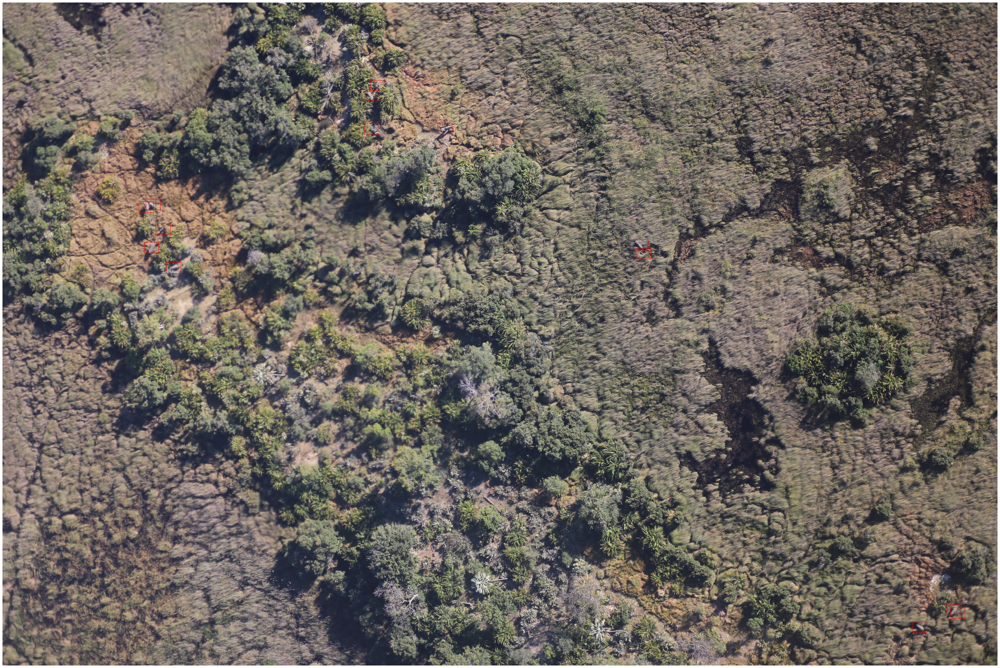

In [9]:
# For each image, enter increasing number of index in the last bracket
img_idx = 1342

img_check = img_list['img_id'][img_idx]
print(img_check)

# Change this value based on what looks good on each image (default = 30)
w = 40
h = 30

x = train_label.loc[train_label.image == f'{img_check}']['x']-w
y = train_label.loc[train_label.image == f'{img_check}']['y']-h
xy = list(zip(x, y))

# Print number of detected elephants so you know how many to look for
print(len(xy))
print(f"h = {h}")
print(f"w = {w}")

# Checking the bounding boxes

# Open image
im = np.array(Image.open(
    f'../data/training_images/{img_check}.jpg'), dtype=np.uint8)

# Create figure and axes
# fig,ax = plt.subplots(1)
fig, ax = plt.subplots(1, figsize=(50, 50))
# Display the image
ax.imshow(im)

# Create Rectangle patches from dataset

for index, value in enumerate(xy):
    rect = patches.Rectangle(
        xy[index], width=w*2, height=h*2, linewidth=1, edgecolor='r', facecolor='none')
    ax.add_patch(rect)

plt.axis("off")
plt.savefig('test1.jpg')

In [1012]:
# After everything looks good, run this cell
img_list['checked'][img_idx] = 1
img_list['new_h'][img_idx] = h
img_list['new_w'][img_idx] = w

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from 

Save the file into CSV so we can continue this process later 

In [1130]:
img_list.to_csv('img_list.csv', index=False)

In [14]:
# Check if we need to change the w & h of the bounding boxes for unchecked images
img_list[img_list['checked'] == 1].describe()

,checked,new_h,new_w
count,351.0,351.000000,351.000000
mean,1.0,32.521368,32.792023
std,0.0,8.149249,8.179036
min,1.0,10.000000,20.000000
25%,1.0,30.000000,30.000000
50%,1.0,30.000000,30.000000
75%,1.0,40.000000,40.000000
max,1.0,100.000000,100.000000


With 350 images checked, the median value of new bounding box h&w is found to be the original guess (~30). For now we will keep this size and come back to it later time permitting. 

In [15]:
train_label.head(5)

,image,x,y,xmin,xmax,ymin,ymax,w,h
0,7c2b5fa7fefd29566bacc3fc14de73d35d64da6c,4294,845,4264,4324,815,875,30,30
1,7c2b5fa7fefd29566bacc3fc14de73d35d64da6c,4498,707,4468,4528,677,737,30,30
2,a46adbea1faf34cf3ecbad37886b33fb01fd8c63,2781,262,2751,2811,232,292,30,30
3,e67a5464acd5bcec0c6b84d0a99961a66981a2ea,626,898,596,656,868,928,30,30
4,e67a5464acd5bcec0c6b84d0a99961a66981a2ea,574,886,544,604,856,916,30,30


In [16]:
train_label_new = pd.merge(train_label, img_list,
                           how='left', left_on='image', right_on='img_id')

train_label_new['new_w'] = [30 if x ==
                            0 else x for x in train_label_new['new_w']]
train_label_new['new_h'] = [30 if x ==
                            0 else x for x in train_label_new['new_h']]

train_label_new['xmin'] = np.array(
    train_label_new['x'])-np.array(train_label_new['new_w'])
train_label_new['xmax'] = np.array(
    train_label_new['x'])+np.array(train_label_new['new_w'])

train_label_new['ymin'] = np.array(
    train_label_new['y'])-np.array(train_label_new['new_h'])
train_label_new['ymax'] = np.array(
    train_label_new['y'])+np.array(train_label_new['new_h'])

train_label_new = train_label_new[[
    'image', 'x', 'y', 'xmin', 'xmax', 'ymin', 'ymax', 'new_w', 'new_h']]
train_label_new.to_csv('train_label_new',index=False)

In [38]:
w_h_train = train_metadata[['image_name','width','height']]
w_h_test = test_metadata[['image_name','width','height']]

#Normalize training labels

train_label_merge = pd.merge(train_label_new, w_h_train,
                           how='left', left_on='image', right_on='image_name')

train_label_norm = train_label_merge.copy()
train_label_norm['x'] = train_label_norm['x']/train_label_norm['width']
train_label_norm['y'] = train_label_norm['y']/train_label_norm['height']
train_label_norm['xmin'] = train_label_norm['xmin']/train_label_norm['width']
train_label_norm['xmax'] = train_label_norm['xmax']/train_label_norm['width']
train_label_norm['ymin'] = train_label_norm['ymin']/train_label_norm['height']
train_label_norm['ymax'] = train_label_norm['ymax']/train_label_norm['height']
train_label_norm['new_w'] = train_label_norm['new_w']/train_label_norm['width']
train_label_norm['new_h'] = train_label_norm['new_h']/train_label_norm['height']

train_label_norm = train_label_norm[[
    'image', 'x', 'y', 'xmin', 'xmax', 'ymin', 'ymax', 'new_w', 'new_h']]


# Same for Test Labels

test_label_merge = pd.merge(test_label, w_h_test,
                           how='left', left_on='image', right_on='image_name')

test_label_norm = test_label_merge.copy()
test_label_norm['x'] = test_label_norm['x']/test_label_norm['width']
test_label_norm['y'] = test_label_norm['y']/test_label_norm['height']
test_label_norm['xmin'] = test_label_norm['xmin']/test_label_norm['width']
test_label_norm['xmax'] = test_label_norm['xmax']/test_label_norm['width']
test_label_norm['ymin'] = test_label_norm['ymin']/test_label_norm['height']
test_label_norm['ymax'] = test_label_norm['ymax']/test_label_norm['height']
test_label_norm['w'] = test_label_norm['w']/test_label_norm['width']
test_label_norm['h'] = test_label_norm['h']/test_label_norm['height']

test_label_norm = test_label_norm[[
    'image', 'x', 'y', 'xmin', 'xmax', 'ymin', 'ymax', 'w', 'h']]

train_label_norm.head()

,image,x,y,xmin,xmax,ymin,ymax,new_w,new_h
0,7c2b5fa7fefd29566bacc3fc14de73d35d64da6c,0.777195,0.228997,0.771765,0.782624,0.220867,0.237127,0.005430,0.008130
1,7c2b5fa7fefd29566bacc3fc14de73d35d64da6c,0.814118,0.191599,0.808688,0.819548,0.183469,0.199729,0.005430,0.008130
2,a46adbea1faf34cf3ecbad37886b33fb01fd8c63,0.503348,0.071003,0.497919,0.508778,0.062873,0.079133,0.005430,0.008130
3,e67a5464acd5bcec0c6b84d0a99961a66981a2ea,0.113385,0.243558,0.106140,0.120630,0.232710,0.254407,0.007245,0.010849
4,e67a5464acd5bcec0c6b84d0a99961a66981a2ea,0.103967,0.240304,0.096722,0.111212,0.229455,0.251153,0.007245,0.010849


In [39]:
# Create label files for training data
for index, row in train_label_norm.iterrows():
    f = open(f"../data/training_labels/{row[0]}.txt", 'a')
    f.write(f"1 {row[1]} {row[2]} {row[7]} {row[8]}\n")
    f.close()

In [40]:
# Create label files for test data
# No change to test_label width and height here

for index, row in test_label_norm.iterrows():
    f = open(f"../data/test_labels/{row[0]}.txt", 'a')
    f.write(f"1 {row[1]} {row[2]} {row[7]} {row[8]}\n")
    f.close()

## Move to RetinaNet - creating annotations

out_file.write(f'training_data/images/{image_id}.jpg,{x1},{y1},{x2},{y2},{cls}\n')

In [22]:
train_labels = pd.read_csv('train_label_new',
                            usecols=['image','xmin','xmax','ymin','ymax'])[['image','xmin','ymin','xmax','ymax']]

annotations = train_labels.copy()
annotations['path'] = [f"../data/training_images/{x}.jpg" for x in annotations['image']]
annotations['xmin'] = [x if x > 0 else 0 for x in annotations['xmin']]
annotations['xmin'] = [x if x < 5472 else 5471 for x in annotations['xmin']]
annotations['ymin'] = [x if x > 0 else 0 for x in annotations['ymin'] ]
annotations['ymin'] = [x if x < 3648 else 3647 for x in annotations['ymin'] ]

annotations['xmax'] = [x if x < 5472 else 5472 for x in annotations['xmax'] ]
annotations['ymax'] = [x if x < 3648 else 3648 for x in annotations['ymax'] ]
annotations['class'] = 'elephant'

annotations[['xmin','ymin','xmax','ymax']]=annotations[['xmin','ymin','xmax','ymax']].astype(int)

annotations.to_csv('annotations.csv',columns=['path','xmin','ymin','xmax','ymax','class'],
                  index=False, header=False)


In [23]:
annotations.head()

,image,xmin,ymin,xmax,ymax,path,class
0,7c2b5fa7fefd29566bacc3fc14de73d35d64da6c,4264,815,4324,875,../data/training_images/7c2b5fa7fefd29566bacc3...,elephant
1,7c2b5fa7fefd29566bacc3fc14de73d35d64da6c,4468,677,4528,737,../data/training_images/7c2b5fa7fefd29566bacc3...,elephant
2,a46adbea1faf34cf3ecbad37886b33fb01fd8c63,2751,232,2811,292,../data/training_images/a46adbea1faf34cf3ecbad...,elephant
3,e67a5464acd5bcec0c6b84d0a99961a66981a2ea,586,858,666,938,../data/training_images/e67a5464acd5bcec0c6b84...,elephant
4,e67a5464acd5bcec0c6b84d0a99961a66981a2ea,534,846,614,926,../data/training_images/e67a5464acd5bcec0c6b84...,elephant


In [24]:
# Adding empty columns for images without annotations 

train_imgs = os.listdir("../data/training_images/")
train_img_paths = [f"../data/training_images/{x}" for x in train_imgs]

empty = [x for x in train_img_paths if x not in set(annotations['path'])]

for img in empty:
    with open("annotations.csv", "a") as f:
        f.write(f"{img},,,,,\n")
    

In [25]:
test_label = pd.read_csv("../data/test_elephants.csv", header=None)
test_label.columns = ['image', 'x', 'y']
test_label['image'] = [f"../data/test_images/{x}.jpg" for x in test_label['image']]
test_label['xmin'] = [x-30 if x-30 >0 else 0 for x in test_label['x']]
test_label['xmin'] = [x if x < 5472 else 5471 for x in test_label['xmin']]

test_label['ymin'] = [x-30 if x-30 >0 else 0 for x in test_label['y']]
test_label['ymin'] = [x if x < 3648 else 3647 for x in test_label['ymin']]

test_label['xmax'] = [x+30 for x in test_label['x']]
test_label['ymax'] = [x+30 for x in test_label['y']]

test_label['xmax'] = [x if x < 5472 else 5472 for x in test_label['xmax']]
test_label['ymax'] = [x if x < 3648 else 3648 for x in test_label['ymax']]

test_label['class'] = 'elephant'
test_label[['xmin','ymin','xmax','ymax']]=test_label[['xmin','ymin','xmax','ymax']].astype(int)

test_label.drop(columns=['x','y'],inplace=True)

test_label.to_csv('test_annotations.csv',
                  index=False, header=False)

In [26]:
test_imgs = os.listdir("../data/test_images/")
test_img_paths = [f"../data/test_images/{x}" for x in test_imgs]

empty = [x for x in test_img_paths if x not in set(test_label['image'])]

for img in empty:
    with open("test_annotations.csv", "a") as f:
        f.write(f"{img},,,,,\n")


Test and Validation split

In [27]:
from sklearn.model_selection import train_test_split

test_annotations = pd.read_csv("test_annotations.csv",header=None,dtype=str)

test_paths,val_paths = train_test_split(test_img_paths,random_state=19,test_size=.45)

test_annot = test_annotations[test_annotations[0].isin(test_paths)]
val_annot = test_annotations[test_annotations[0].isin(test_paths) == False]


test_annot.fillna('',inplace=True)

test_annot.to_csv('test_annot.csv',
                  index=False, header=False)
val_annot.to_csv('val_annot.csv',
                  index=False, header=False)



In [11]:
# Create classes list

with open('classes.csv','w') as f:
    f.write('elephant,0')

## Anchor Optimization

After running anchor optimization using anchor optimization  
```!python optimize_anchors.py /Users/akharina/Documents/BootCamp/Capstone/elephant_detection/annotations.csv```


Final best anchor configuration  
Ratios: [0.578, 0.723, 1.0, 1.384, 1.73]  
Scales: [1.211, 1.533, 1.875]  

Final best anchor configuration  
Ratios: [0.45, 0.694, 1.0, 1.44, 2.22]  
Scales: [0.938, 1.211, 1.533]  
Number of labels that don't have any matching anchor: 0  


In [1]:
!python3 optimize_anchors.py /Users/akharina/Documents/BootCamp/Capstone/elephant_detection/annotations.csv --ratios=5 --no-resize

python3: can't open file 'optimize_anchors.py': [Errno 2] No such file or directory


## Debug

In [ ]:
!retinanet-debug csv /Users/akharina/Documents/BootCamp/Capstone/elephant_detection/annotations.csv /Users/akharina/Documents/BootCamp/Capstone/elephant_detection/classes.csv